In [39]:
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc3 as pm
import seaborn
import theano.tensor as tt
import warnings
from IPython.core.pylabtools import figsize
import seaborn as sns
from sklearn.metrics import (roc_curve, roc_auc_score, confusion_matrix, accuracy_score, f1_score, 
                             precision_recall_curve) 
from sklearn.metrics import confusion_matrix

In [3]:
df = pd.read_csv('./dataset/occupancy_data/datatest.txt')
df.head()

,date,Temperature,Humidity,Light,CO2,HumidityRatio,Occupancy
140,2015-02-02 14:19:00,23.7000,26.272,585.200000,749.200000,0.004764,1
141,2015-02-02 14:19:59,23.7180,26.290,578.400000,760.400000,0.004773,1
142,2015-02-02 14:21:00,23.7300,26.230,572.666667,769.666667,0.004765,1
143,2015-02-02 14:22:00,23.7225,26.125,493.750000,774.750000,0.004744,1
144,2015-02-02 14:23:00,23.7540,26.200,488.600000,779.000000,0.004767,1


In [5]:
df["date"] = pd.to_datetime(df["date"])
df.describe()

,Temperature,Humidity,Light,CO2,HumidityRatio,Occupancy
count,2665.000000,2665.000000,2665.000000,2665.000000,2665.000000,2665.000000
mean,21.433876,25.353937,193.227556,717.906470,0.004027,0.364728
std,1.028024,2.436842,250.210906,292.681718,0.000611,0.481444
min,20.200000,22.100000,0.000000,427.500000,0.003303,0.000000
25%,20.650000,23.260000,0.000000,466.000000,0.003529,0.000000
50%,20.890000,25.000000,0.000000,580.500000,0.003815,0.000000
75%,22.356667,26.856667,442.500000,956.333333,0.004532,1.000000
max,24.408333,31.472500,1697.250000,1402.250000,0.005378,1.000000


In [9]:
# Check for null value
pd.isna(df).sum()

date             0
Temperature      0
Humidity         0
Light            0
CO2              0
HumidityRatio    0
Occupancy        0
dtype: int64

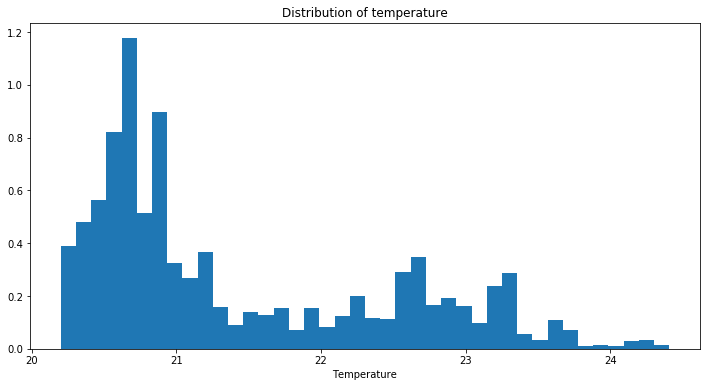

In [21]:
# Viewing Temperature distribution
figsize(12, 6)
plt.hist(df["Temperature"], bins=40, density=True)
plt.xlabel('Temperature')
plt.title('Distribution of temperature')
plt.show()

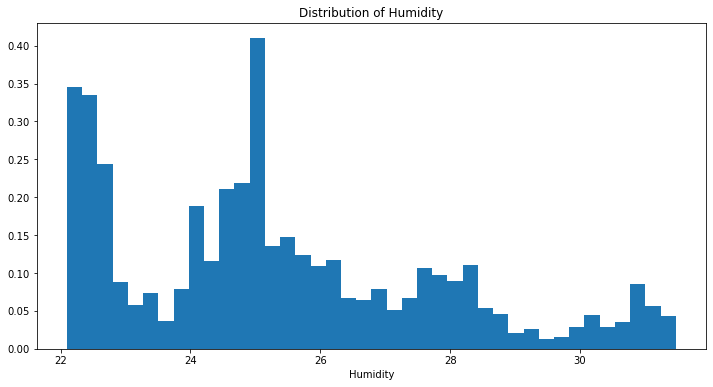

In [22]:
# Viewing Humidity distribution
figsize(12, 6)
plt.hist(df["Humidity"], bins=40, density=True)
plt.xlabel('Humidity')
plt.title('Distribution of Humidity')
plt.show()

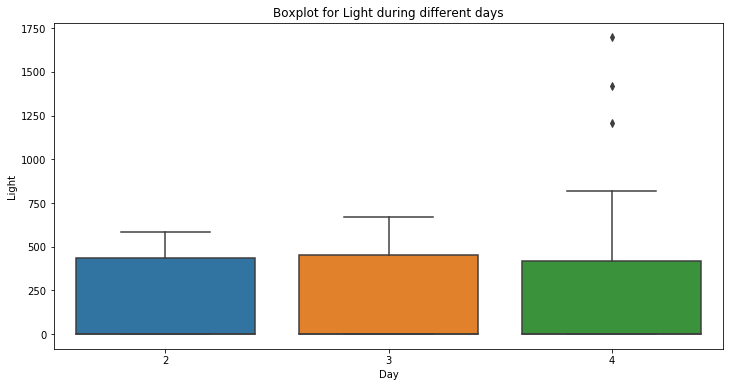

In [25]:
# Viewing distribution of Light over the 3 days
figsize(12, 6)
sns.boxplot(x=df["date"].dt.day, y=df["Light"])
plt.xlabel('Day')
plt.ylabel('Light')
plt.title('Boxplot for Light during different days')
plt.show()

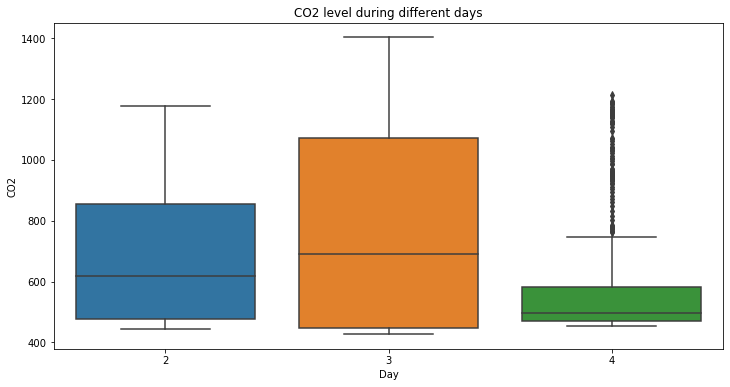

In [28]:
# Viewing the CO2 distribution
sns.boxplot(x=df['date'].dt.day, y=df['CO2'])
plt.xlabel('Day')
plt.title('CO2 level during different days')
plt.show()

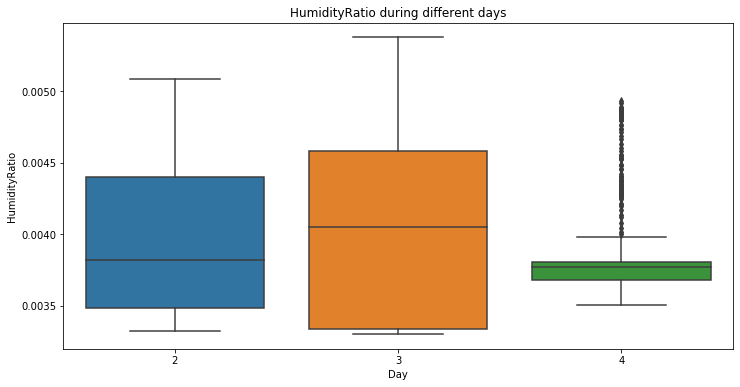

In [29]:
# Viewing the Humidity ratio distribution

sns.boxplot(x=df['date'].dt.day, y=df['HumidityRatio'])
plt.xlabel('Day')
plt.title('HumidityRatio during different days')
plt.show()

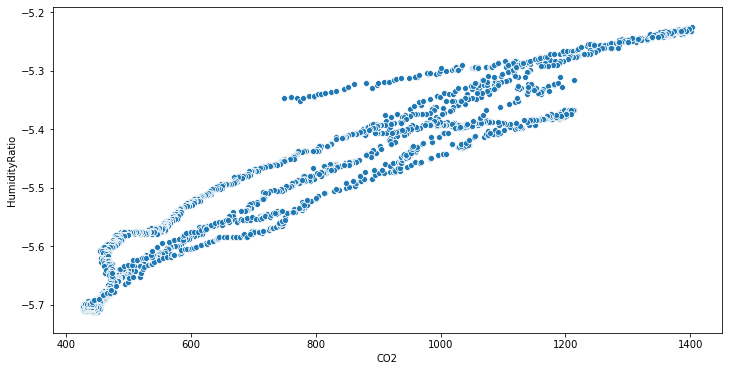

In [36]:
# Checking for correlation between HumidityRatio and CO2 level
# NOTE that HumidityRatio is log transformed for easy viewing
ax = sns.scatterplot(df["CO2"], np.log(df["HumidityRatio"]))


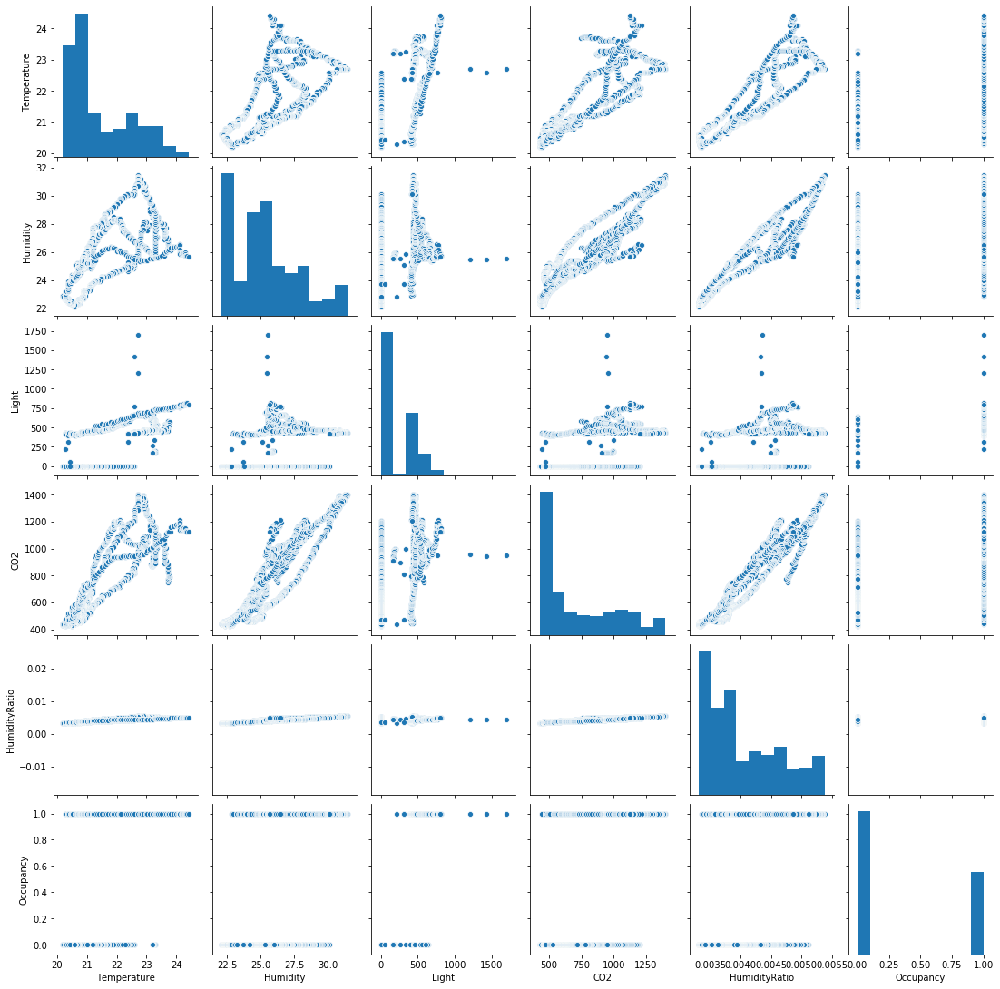

In [37]:
ax = seaborn.pairplot(df)

In [58]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

x = df[["Temperature", "Humidity", "Light", "CO2", "HumidityRatio"]]
y = df["Occupancy"]

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=0)
logit = LogisticRegression()
logit.fit(x_train, y_train)

logit.score(x_test, y_test)

0.9774859287054409

In [59]:
pd.DataFrame(logit.coef_, columns = x_train.columns)

,Temperature,Humidity,Light,CO2,HumidityRatio
0,-0.927961,0.479704,0.019418,0.002115,4.319984e-07


In [65]:
from sklearn.metrics import roc_auc_score, classification_report

y_pred = logit.predict(x_test)
print("AUC ROC: {:.2f}".format(roc_auc_score(y_pred, y_test)))

print(classification_report(y_pred, y_test))

AUC ROC: 0.97
              precision    recall  f1-score   support

           0       0.97      1.00      0.98       339
           1       0.99      0.94      0.97       194

    accuracy                           0.98       533
   macro avg       0.98      0.97      0.98       533
weighted avg       0.98      0.98      0.98       533

